<a href="https://colab.research.google.com/github/RajiBabu/AlternusVera/blob/master/Authenticity_of_the_news_Source_Rajalakshmi_Babu.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Alternus Vera 

   ## Student ID: 011486345              
   ## Student Name: Rajalakshmi Babu

   ### Authenticity of the news :

Authenticity is one of the important factor while finding a fake news. The authenticity is based on the author of the news, medium where it has been published and location/venue where it has been delivered. I have chosen the authenticity factor to be location/venue - origin of the news. In the given dataset, 'context' column gives a relevant information. 


### Process of my approach

1. Data Preprocessing
2. Visualization
3. Lemmatization
4. Stemming
5. Spell Check
6. Dictionary
7. LDA
8. LDA2Vec
9. TF-IDF
10. LDA using TF-IDF 
11. Decision Trees
12. Naive Bayes Classifier
13. Random Forest
14. Data enrichment
15. Testing and Validation 




### Team Contributions example:

|Features  |  Member |
|-----|-----|
| Sensationalism                         |  Paramdeep Saini |  
| Misleading headings                |  Julian Simon | 
| Authenticity                   |  Rajalakshmi Babu  |   
| Biased or Slanted News                             |  Viswanath Singh Kambam |




#### Dataset Exploration

In [0]:
# read data into a dataframe
import pandas as pd
import seaborn as sns; sns.set() 
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report,confusion_matrix


In [0]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [3]:
link = "https://drive.google.com/open?id=1m-5saoMa-QoYGUiT1dIykOTTjUXB3I01"
fluff, id = link.split('=')
print (id) # Verify that you have everything after '='

1m-5saoMa-QoYGUiT1dIykOTTjUXB3I01


In [0]:
downloaded = drive.CreateFile({'id':id}) 
downloaded.GetContentFile('train.xlsx')  
dfs_train = pd.read_excel("train.xlsx")

In [5]:
#observe a row
print("Number of Rows and Columns::", dfs_train.shape)
print(dfs_train.loc[0])

Number of Rows and Columns:: (10269, 14)
ID                                                              2635.json
label                                                               False
statement               Says the Annies List political group supports ...
subject(s)                                                       abortion
speaker                                                      dwayne-bohac
speaker's job title                                  State representative
state info                                                          Texas
party affiliation                                              republican
barely true counts                                                      0
false counts                                                            1
half true counts                                                        0
mostly true counts                                                      0
pants on fire counts                                                   

### Data Visualizations:

Data visualization helps to better understand the correlation between the columns

In [0]:
#Pre-Processing for "context" - the source of the news
X_train=dfs_train["context"]
Y_train=dfs_train["label"]

#### Cross Tabulation

In [7]:
ct=pd.crosstab(X_train,Y_train,margins=True)
ct

label,False,True,barely-true,half-true,mostly-true,pants-fire,All
context,,,,,,,
CNN's 'The Situation Room',1,0,0,0,0,0,1
CNN's State of the Union with John King,0,0,0,0,1,0,1
This Week with George Stephanopoulos,0,0,0,1,0,0,1
Washington Report newsletter to constituents.,1,0,0,0,0,0,1
a Webcast,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...
written testimony to a Wisconsin Senate committee,0,0,0,0,1,0,1
x,0,1,0,0,0,0,1
yard signs posted anonymously opposing a proposed office park redevelopment in Northwest Austin,0,0,0,0,1,0,1


In [8]:
#Sorted to the highest to lowest
ct.sort_values('All', ascending=False)

label,False,True,barely-true,half-true,mostly-true,pants-fire,All
context,,,,,,,
All,1974,1662,1642,2106,1948,831,10163
a news release,44,44,45,46,41,22,242
an interview,58,34,30,47,47,13,229
a press release,41,44,34,46,45,13,223
a speech,34,44,25,55,50,8,216
...,...,...,...,...,...,...,...
"a rally in Hershey, Pa.",0,0,0,0,0,1,1
a rally in New Hampshire,0,0,0,0,1,0,1
a rally in North Carolina,0,0,0,1,0,0,1


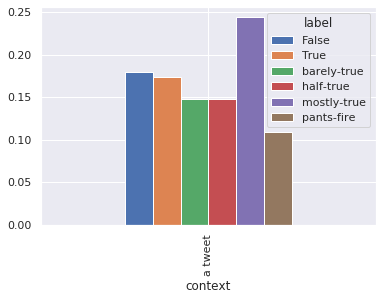

In [9]:
ct_normalized=pd.crosstab(X_train,Y_train,normalize='index', margins=True)
ct_normalized.loc[ct_normalized.index.get_level_values('context') == "a tweet"].plot(kind='bar')

#### Exploration

The chart above explains that the percentage of news from a tweet is authentic or not with respect to true, barely true, half true, mostly true, pants on fire.

#### Lables in the dataset

Eploring the entire dataset based on the columns for the context field give a better understanding of the entire dataset and the percentage of fake and real news present in it.

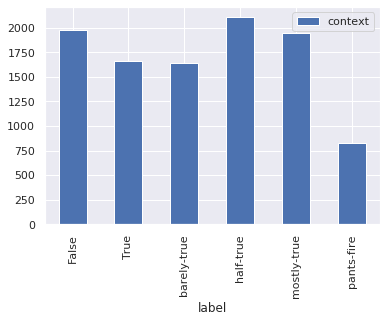

In [10]:
dfTwoCols= dfs_train[['label','context']]
dfTwoCols.groupby("label").count().plot(kind='bar')

#### Verdict:

In order to identify a news to be true or not, we need to claasify them into two criteria, the news is true or the news is false. Since we have many colmuns which gives the in depth knowledge of a news, we are classifying the news to be Fake/False when it is False, Barely-True, Pants-fire and True when it is Half-true, Mostly-true and True

1. False, barely-true, pants-fire as lie --> 0
2. half-true, mostly-true and True as truth --> 1

And introducing new column "verdict" to hold the value

In [11]:
dfTwoCols['verdict'] = dfTwoCols['label'].map({False: 0, True: 1, 'barely-true':0, 'half-true':1,'mostly-true':1,'pants-fire':0})
dfTwoCols

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,label,context,verdict
0,False,a mailer,0
1,half-true,a floor speech.,1
2,mostly-true,Denver,1
3,False,a news release,0
4,half-true,an interview on CNN,1
...,...,...,...
10264,mostly-true,"interview on ""The Colbert Report""",1
10265,mostly-true,an interview,1
10266,half-true,a Republican presidential debate,1
10267,False,a televised debate on Miami's WPLG-10 against ...,0


#### Plot of the Verdict:

The below graph represents the news to be true or false with its label and context. This gives the whole perspective of a news to be true or false. Based on the verdict, we understand that the dataset is trustworthy and has higher truth values when compared to false information. 

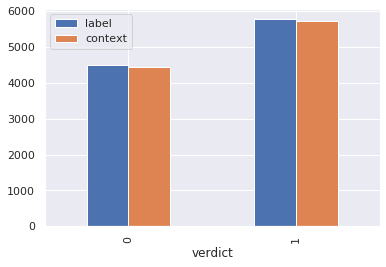

In [12]:
dfTwoCols.groupby("verdict").count().plot(kind='bar')

In [13]:
ct1=pd.crosstab(dfTwoCols["context"],dfTwoCols["verdict"],margins=True)
ct1.sort_values('All', ascending=False)

verdict,0,1,All
context,,,
All,4447,5716,10163
a news release,111,131,242
an interview,101,128,229
a press release,88,135,223
a speech,67,149,216
...,...,...,...
"a rally in Hershey, Pa.",1,0,1
a rally in New Hampshire,0,1,1
a rally in North Carolina,0,1,1


#### Inference 

The above table, indicates  that the source of the news and its authenticity.

## Natural Language Processing
### Data Preprocessing:

The dataset contains approximately 10000 rows in the data set with 14 columns to them. 

In [14]:
# Training dataset
dfs_train

,ID,label,statement,subject(s),speaker,speaker's job title,state info,party affiliation,barely true counts,false counts,half true counts,mostly true counts,pants on fire counts,context
0,2635.json,False,Says the Annies List political group supports ...,abortion,dwayne-bohac,State representative,Texas,republican,0.0,1.0,0.0,0.0,0.0,a mailer
1,10540.json,half-true,When did the decline of coal start? It started...,"energy,history,job-accomplishments",scott-surovell,State delegate,Virginia,democrat,0.0,0.0,1.0,1.0,0.0,a floor speech.
2,324.json,mostly-true,"Hillary Clinton agrees with John McCain ""by vo...",foreign-policy,barack-obama,President,Illinois,democrat,70.0,71.0,160.0,163.0,9.0,Denver
3,1123.json,False,Health care reform legislation is likely to ma...,health-care,blog-posting,NaN,NaN,none,7.0,19.0,3.0,5.0,44.0,a news release
4,9028.json,half-true,The economic turnaround started at the end of ...,"economy,jobs",charlie-crist,NaN,Florida,democrat,15.0,9.0,20.0,19.0,2.0,an interview on CNN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10264,5473.json,mostly-true,There are a larger number of shark attacks in ...,"animals,elections",aclu-florida,NaN,Florida,none,0.0,1.0,1.0,1.0,0.0,"interview on ""The Colbert Report"""
10265,3408.json,mostly-true,Democrats have now become the party of the [At...,elections,alan-powell,NaN,Georgia,republican,0.0,0.0,0.0,1.0,0.0,an interview
10266,3959.json,half-true,Says an alternative to Social Security that op...,"retirement,social-security",herman-cain,NaN,Georgia,republican,4.0,11.0,5.0,3.0,3.0,a Republican presidential debate
10267,2253.json,False,On lifting the U.S. Cuban embargo and allowing...,"florida,foreign-policy",jeff-greene,NaN,Florida,democrat,3.0,1.0,3.0,0.0,0.0,a televised debate on Miami's WPLG-10 against ...


In [15]:
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.stem.porter import *
import numpy as np
np.random.seed(2018)
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

## Stemming and Lemmatizaion
Stemming and Lemmatization are Text Normalization (or sometimes called Word Normalization) techniques 
in the field of Natural Language Processing that are used to prepare text, words, and documents 
for further processing. 

#### Lemmatisation:
Words in third person are changed to first person and verbs in past and future tenses are changed into present.

In [16]:
# lemmatizer
print(WordNetLemmatizer().lemmatize('was', pos='v'))

be


#### Stemming 
Words are reduced to their root form.

In [17]:
# stemmer

stemmer = SnowballStemmer('english')
original_words = ['interviews', 'debates', 'conferences', 'mules', 'denied','died', 'agreed', 'owned', 
           'humbled', 'sized','meeting', 'stating', 'siezing', 'itemization','sensational', 
           'traditional', 'reference', 'colonizer','plotted']
singles = [stemmer.stem(plural) for plural in original_words]
pd.DataFrame(data = {'original word': original_words, 'stemmed': singles})

,original word,stemmed
0,interviews,interview
1,debates,debat
2,conferences,confer
3,mules,mule
4,denied,deni
5,died,die
6,agreed,agre
7,owned,own
8,humbled,humbl
9,sized,size


In [0]:
# Python libraries and funtions for lemetizing and stemming
def lemmatize_stemming(text):
    return stemmer.stem(WordNetLemmatizer().lemmatize(text, pos='v'))

def preprocess(text):
    result = []
    try:
        for token in gensim.utils.simple_preprocess(text):
            if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
                result.append(lemmatize_stemming(token))
    except:
        pass
        
    return result

In [19]:
# testing 

doc_sample = dfs_train[dfs_train['ID'] == '2635.json']["context"][0]

print('original document: ')
words = []
for word in doc_sample.split(' '):
    words.append(word)
print(words)
print('\n\n tokenized and lemmatized document: ')
print(preprocess(doc_sample))

original document: 
['a', 'mailer']


 tokenized and lemmatized document: 
['mailer']


In [20]:
# on successful execution on the sample test, processing for all documents
processed_docs = dfs_train['context'].map(preprocess)
processed_docs[:10]

0                           [mailer]
1                    [floor, speech]
2                           [denver]
3                     [news, releas]
4                        [interview]
5             [onlin, opinion, piec]
6                    [press, releas]
7    [democrat, debat, philadelphia]
8                           [websit]
9                     [onlin, video]
Name: context, dtype: object

In [21]:
# create the dictionary
dictionary = gensim.corpora.Dictionary(processed_docs)
count = 0
for k, v in dictionary.iteritems():
    print(k, v)
    count += 1
    if count > 10:
        break

0 mailer
1 floor
2 speech
3 denver
4 news
5 releas
6 interview
7 onlin
8 opinion
9 piec
10 press


In [22]:
# remove all words that appear too many or too few times and restrict to 100000 words
dictionary.filter_extremes(no_below=15, no_above=0.5, keep_n=100000)
print(dictionary)

Dictionary(200 unique tokens: ['mailer', 'floor', 'speech', 'denver', 'news']...)


In [23]:
bow_corpus = [dictionary.doc2bow(doc) for doc in processed_docs]
bow_corpus[10][0]


(2, 1)

In [24]:
# corpus and frequency count for each document
bow_doc_4310 = bow_corpus[4310]
for i in range(len(bow_doc_4310)):
    print("Word {} (\"{}\") appears {} time.".format(bow_doc_4310[i][0], 
                                               dictionary[bow_doc_4310[i][0]], 
bow_doc_4310[i][1]))
print(len(bow_corpus))

10269


### Naive baysian classifier


In [0]:
# Create a pipeline
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report,confusion_matrix

pipeline = Pipeline([
    ('bow',CountVectorizer(analyzer=preprocess)), # converts strings to integer counts
    ('tfidf',TfidfTransformer()), # converts integer counts to weighted TF-IDF scores
    ('classifier',MultinomialNB()) # train on TF-IDF vectors with Naive Bayes classifier
])

In [26]:
#print(bow_corpus)
class_train=np.array(dfTwoCols["verdict"])
print(class_train)
class_train=class_train.reshape(-1,1)
print(class_train)

pipeline.fit(dfs_train['statement'],class_train)

[0 1 1 ... 1 0 0]
[[0]
 [1]
 [1]
 ...
 [1]
 [0]
 [0]]


/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Pipeline(memory=None,
         steps=[('bow',
                 CountVectorizer(analyzer=<function preprocess at 0x7fbdc24cdbf8>,
                                 binary=False, decode_error='strict',
                                 dtype=<class 'numpy.int64'>, encoding='utf-8',
                                 input='content', lowercase=True, max_df=1.0,
                                 max_features=None, min_df=1,
                                 ngram_range=(1, 1), preprocessor=None,
                                 stop_words=None, strip_accents=None,
                                 token_pattern='(?u)\\b\\w\\w+\\b',
                                 tokenizer=None, vocabulary=None)),
                ('tfidf',
                 TfidfTransformer(norm='l2', smooth_idf=True,
                                  sublinear_tf=False, use_idf=True)),
                ('classifier',
                 MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True))],
         verbose=False)

In [27]:
# test change and assign classification on dataset
predictions = []
dfs_test = pd.read_excel("test.xlsx")
msg_test=dfs_test["context"].dropna()
dfTwoCols_test= dfs_test[['label','context']]
dfTwoCols_test['verdict'] = dfTwoCols_test['label'].map({False: 0, True: 1, 'barely-true':0, 'half-true':1,'mostly-true':1,'pants-fire':0})
dfTwoCols_test
class_test=np.array(dfTwoCols_test["verdict"])
print(class_test)
class_test=class_test.reshape(-1,1)
class_test = class_test[0:1264]
print(class_test)
predictions = pipeline.predict(msg_test)
predictions = predictions[0:1264]

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


[0 1 1 ... 1 0 0]
[[0]
 [1]
 [1]
 ...
 [0]
 [0]
 [0]]


In [28]:
class_test.shape

(1264, 1)

In [29]:

predictions.shape

(1264,)

In [30]:
print(classification_report(class_test,predictions))

              precision    recall  f1-score   support

           0       0.45      0.58      0.50       548
           1       0.58      0.45      0.51       716

    accuracy                           0.51      1264
   macro avg       0.52      0.52      0.51      1264
weighted avg       0.52      0.51      0.51      1264



#### NB inference:

Based on the dataset, the above gives the precision, recall for the context. The average precision is about 51%

## Heat Map Confusion Matrix

A heat map can be plotted on the basis of the outcome form the Naïve Bayesian classifier which is found below

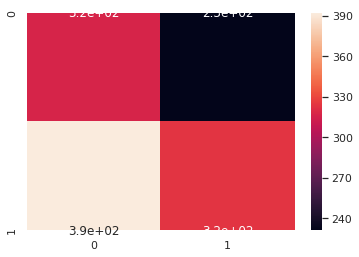

In [31]:

sns.heatmap(confusion_matrix(class_test,predictions),annot=True)
# references: https://www.kaggle.com/astandrik/simple-spam-filter-using-naive-bayes

## Analysis Using Data Enrichment
Ref: https://blog.lftechnology.com/predicting-sentiment-on-news-data-45c5c22ec2e3

Sentiment analysis has been performed by inducing a new dataset into the model. This dataset has a common fiel called "source" which can be infered as "context" in our exising dataset This is the enrichment we have acheiived for this step

In [33]:
link = "https://drive.google.com/open?id=1672UYYKfHRldzwE8XcBgXfKM0uXOeWjo"
fluff, id = link.split('=')
print (id) # Verify that you have everything after '='

1672UYYKfHRldzwE8XcBgXfKM0uXOeWjo


In [0]:
downloaded = drive.CreateFile({'id':id}) 
downloaded.GetContentFile('uci-news-aggregator.xlsx')  

In [0]:
# Data enrichment
data_source = pd.read_excel('uci-news-aggregator.xlsx')


In [37]:
data_source

,ID,TITLE,URL,PUBLISHER,CATEGORY,STORY,HOSTNAME,TIMESTAMP
0,1,"Fed official says weak data caused by weather,...",http://www.latimes.com/business/money/la-fi-mo...,Los Angeles Times,b,ddUyU0VZz0BRneMioxUPQVP6sIxvM,www.latimes.com,1394470370698
1,2,Fed's Charles Plosser sees high bar for change...,http://www.livemint.com/Politics/H2EvwJSK2VE6O...,Livemint,b,ddUyU0VZz0BRneMioxUPQVP6sIxvM,www.livemint.com,1394470371207
2,3,US open: Stocks fall after Fed official hints ...,http://www.ifamagazine.com/news/us-open-stocks...,IFA Magazine,b,ddUyU0VZz0BRneMioxUPQVP6sIxvM,www.ifamagazine.com,1394470371550
3,4,"Fed risks falling 'behind the curve', Charles ...",http://www.ifamagazine.com/news/fed-risks-fall...,IFA Magazine,b,ddUyU0VZz0BRneMioxUPQVP6sIxvM,www.ifamagazine.com,1394470371793
4,5,Fed's Plosser: Nasty Weather Has Curbed Job Gr...,http://www.moneynews.com/Economy/federal-reser...,Moneynews,b,ddUyU0VZz0BRneMioxUPQVP6sIxvM,www.moneynews.com,1394470372027
...,...,...,...,...,...,...,...,...
422414,422933,Surgeons to remove 4-year-old's rib to rebuild...,http://www.cbs3springfield.com/story/26378648/...,WSHM-TV,m,dpcLMoJD69UYMXMxaoEFnWql9YjQM,www.cbs3springfield.com,1409229190251
422415,422934,Boy to have surgery on esophagus after battery...,http://www.wlwt.com/news/boy-to-have-surgery-o...,WLWT Cincinnati,m,dpcLMoJD69UYMXMxaoEFnWql9YjQM,www.wlwt.com,1409229190508
422416,422935,Child who swallowed battery to have reconstruc...,http://www.newsnet5.com/news/local-news/child-...,NewsNet5.com,m,dpcLMoJD69UYMXMxaoEFnWql9YjQM,www.newsnet5.com,1409229190771
422417,422936,Phoenix boy undergoes surgery to repair throat...,http://www.wfsb.com/story/26368078/phoenix-boy...,WFSB,m,dpcLMoJD69UYMXMxaoEFnWql9YjQM,www.wfsb.com,1409229191071


/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 141 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 141 missing from current font.
  font.set_text(s, 0, flags=flags)


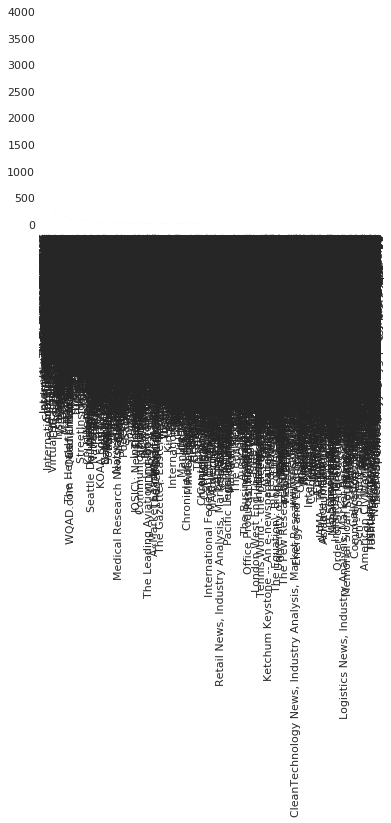

TypeError: ignored

In [38]:
# The publisher is the news source in this dataset 
data_sentiment = data_source['PUBLISHER'].value_counts().plot(kind="bar")
plt.show()

# train/test data split
from sklearn.model_selection import train_test_split
train, test = train_test_split(data_sentiment, test_size=0.2)

### Sentiment analysis

We have used the “Vader lexicon” from the ntlk library for our analysis. This lexicon library returns a 
sentiment score in the range of -1 to +1, and as they imply it ranges from negative to positive. This library gives a cumulative score on each sentence based on the sentiment score of each of the Vader listed words comprising the sentence.  


 The ntlk_sentiment function makes use of the nltk.sentiment.sentiment_analyzer module to access the sentiment score of each word comprising the sentence. Thus, for each of the sentences we have a list of values showing negative, neutral and positive scores. We have also reclassified the scores in a way to get a better understanding of the dataset.  


In [39]:
# Using vader lexicon to determine sentiment
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

In [0]:
def nltk_sentiment(sentence):
    from nltk.sentiment.vader import SentimentIntensityAnalyzer
    
    nltk_sentiment = SentimentIntensityAnalyzer()
    score = nltk_sentiment.polarity_scores(sentence)
    return score

In [41]:
for row in dfs_train["context"]:
    try:
        nltk_context = nltk_sentiment(row) 
    except:
        pass
    
print (nltk_context)


/usr/local/lib/python3.6/dist-packages/nltk/twitter/__init__.py:20: UserWarning: The twython library has not been installed. Some functionality from the twitter package will not be available.
  warnings.warn("The twython library has not been installed. "


{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}


In [0]:
nltk_results = [nltk_sentiment(row) for row in dfs_train["statement"]]
results_df = pd.DataFrame(nltk_results)
text_df = pd.DataFrame(dfs_train, columns = ['statement'])
nltk_df = text_df.join(results_df)
verdict_df=pd.DataFrame(dfTwoCols, columns=['verdict'])
nltk_df=nltk_df.join(verdict_df)

In [43]:
nltk_df

,statement,neg,neu,pos,compound,verdict
0,Says the Annies List political group supports ...,0.115,0.692,0.192,0.2500,0
1,When did the decline of coal start? It started...,0.000,0.902,0.098,0.3612,1
2,"Hillary Clinton agrees with John McCain ""by vo...",0.107,0.687,0.206,0.3182,1
3,Health care reform legislation is likely to ma...,0.000,0.606,0.394,0.7579,0
4,The economic turnaround started at the end of ...,0.000,1.000,0.000,0.0000,1
...,...,...,...,...,...,...
10264,There are a larger number of shark attacks in ...,0.319,0.619,0.062,-0.7506,1
10265,Democrats have now become the party of the [At...,0.000,0.828,0.172,0.4019,1
10266,Says an alternative to Social Security that op...,0.000,0.839,0.161,0.5859,1
10267,On lifting the U.S. Cuban embargo and allowing...,0.000,1.000,0.000,0.0000,0


In [44]:
# recassify results to get better understanding
nltk_df.loc[nltk_df['compound'] > 0.2, 'compound'] = 1
nltk_df.loc[nltk_df['compound'] < -0.2, 'compound'] = -1
nltk_df.loc[(nltk_df['compound'] > -0.2) & (nltk_df['compound'] < 0.2), 'compound'] = 0
nltk_df


,statement,neg,neu,pos,compound,verdict
0,Says the Annies List political group supports ...,0.115,0.692,0.192,1.0,0
1,When did the decline of coal start? It started...,0.000,0.902,0.098,1.0,1
2,"Hillary Clinton agrees with John McCain ""by vo...",0.107,0.687,0.206,1.0,1
3,Health care reform legislation is likely to ma...,0.000,0.606,0.394,1.0,0
4,The economic turnaround started at the end of ...,0.000,1.000,0.000,0.0,1
...,...,...,...,...,...,...
10264,There are a larger number of shark attacks in ...,0.319,0.619,0.062,-1.0,1
10265,Democrats have now become the party of the [At...,0.000,0.828,0.172,1.0,1
10266,Says an alternative to Social Security that op...,0.000,0.839,0.161,1.0,1
10267,On lifting the U.S. Cuban embargo and allowing...,0.000,1.000,0.000,0.0,0


In [0]:
nltk_df_f=nltk_df[["statement","compound","verdict"]]

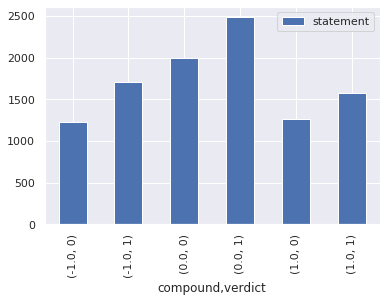

In [46]:
nltk_df_f.groupby(["compound","verdict"]).count().plot(kind='bar')

#### Inference:

The effect of negative, neutral and positive context on true and false news can be understood

## LDA

TF-IDF is an algorithm it has 2 subparts:
  1. Terms frequency 
  2. Inverse data frequency. 

TF gives us the frequency of the word in each document while IDF give us the weight of all rare words present in the document. 
In LDA we divide the document on the basic of topics and classify words as per topic. Here we are checking the frequency of each word and comparing it with normal LDA model.


In [0]:
from gensim import corpora, models

tfidf = models.TfidfModel(bow_corpus)

In [0]:
corpus_tfidf = tfidf[bow_corpus]

In [49]:

from pprint import pprint

for doc in corpus_tfidf:
    pprint(doc)
    break

[(0, 1.0)]


In [0]:
#lda bag of words 
lda_model = gensim.models.LdaMulticore(bow_corpus, num_topics=10, id2word=dictionary, passes=2, workers=2)

In [51]:
for idx, topic in lda_model.print_topics(-1):
    print('Topic: {} \nWords: {}'.format(idx, topic))

Topic: 0 
Words: 0.148*"speech" + 0.121*"post" + 0.066*"facebook" + 0.056*"convent" + 0.051*"floor" + 0.035*"nation" + 0.035*"democrat" + 0.034*"republican" + 0.030*"hous" + 0.026*"parti"
Topic: 1 
Words: 0.252*"releas" + 0.164*"press" + 0.151*"news" + 0.050*"interview" + 0.036*"mail" + 0.035*"chain" + 0.024*"washington" + 0.024*"campaign" + 0.021*"post" + 0.018*"hous"
Topic: 2 
Words: 0.099*"press" + 0.081*"confer" + 0.059*"comment" + 0.048*"appear" + 0.047*"state" + 0.047*"remark" + 0.046*"broadcast" + 0.039*"meet" + 0.037*"msnbc" + 0.033*"speech"
Topic: 3 
Words: 0.277*"debat" + 0.093*"campaign" + 0.074*"mailer" + 0.055*"news" + 0.046*"democrat" + 0.028*"newslett" + 0.028*"releas" + 0.021*"event" + 0.021*"orlando" + 0.020*"twitter"
Topic: 4 
Words: 0.105*"tweet" + 0.080*"radio" + 0.075*"email" + 0.067*"letter" + 0.035*"fundrais" + 0.032*"media" + 0.031*"newspap" + 0.023*"tampa" + 0.021*"blast" + 0.021*"social"
Topic: 5 
Words: 0.426*"interview" + 0.064*"radio" + 0.042*"column" + 0.0

From the above result we can distinguish different topics using words in each topic and there corresponding weights


Let us  TF-IDF for running LDA

In [0]:
#lda tf-idf 
lda_model_tfidf = gensim.models.LdaMulticore(corpus_tfidf, num_topics=10, id2word=dictionary, passes=2, workers=4)

In [53]:
for idx, topic in lda_model_tfidf.print_topics(-1):
    print('Topic: {} Word: {}'.format(idx, topic))

Topic: 0 Word: 0.104*"newspap" + 0.069*"comment" + 0.043*"broadcast" + 0.037*"washington" + 0.030*"hear" + 0.029*"interview" + 0.027*"commentari" + 0.027*"time" + 0.023*"legisl" + 0.021*"hous"
Topic: 1 Word: 0.370*"interview" + 0.120*"news" + 0.044*"confer" + 0.039*"ralli" + 0.039*"releas" + 0.025*"appear" + 0.024*"campaign" + 0.023*"sunday" + 0.020*"daili" + 0.017*"program"
Topic: 2 Word: 0.065*"report" + 0.062*"speech" + 0.061*"news" + 0.050*"campaign" + 0.050*"interview" + 0.041*"msnbc" + 0.028*"discuss" + 0.027*"week" + 0.026*"voter" + 0.024*"austin"
Topic: 3 Word: 0.163*"televis" + 0.160*"press" + 0.124*"releas" + 0.040*"letter" + 0.039*"meet" + 0.039*"interview" + 0.036*"email" + 0.029*"twitter" + 0.019*"blast" + 0.018*"post"
Topic: 4 Word: 0.118*"interview" + 0.070*"speech" + 0.067*"senat" + 0.057*"facebook" + 0.046*"state" + 0.045*"post" + 0.042*"advertis" + 0.038*"floor" + 0.035*"video" + 0.027*"union"
Topic: 5 Word: 0.175*"debat" + 0.132*"radio" + 0.057*"confer" + 0.052*"pres

In [54]:
for index, score in sorted(lda_model[bow_corpus[4310]], key=lambda tup: -1*tup[1]):
    print("\nScore: {}\t \nTopic: {}".format(score, lda_model.print_topic(index, 10)))


Score: 0.10000000149011612	 
Topic: 0.148*"speech" + 0.121*"post" + 0.066*"facebook" + 0.056*"convent" + 0.051*"floor" + 0.035*"nation" + 0.035*"democrat" + 0.034*"republican" + 0.030*"hous" + 0.026*"parti"

Score: 0.10000000149011612	 
Topic: 0.252*"releas" + 0.164*"press" + 0.151*"news" + 0.050*"interview" + 0.036*"mail" + 0.035*"chain" + 0.024*"washington" + 0.024*"campaign" + 0.021*"post" + 0.018*"hous"

Score: 0.10000000149011612	 
Topic: 0.099*"press" + 0.081*"confer" + 0.059*"comment" + 0.048*"appear" + 0.047*"state" + 0.047*"remark" + 0.046*"broadcast" + 0.039*"meet" + 0.037*"msnbc" + 0.033*"speech"

Score: 0.10000000149011612	 
Topic: 0.277*"debat" + 0.093*"campaign" + 0.074*"mailer" + 0.055*"news" + 0.046*"democrat" + 0.028*"newslett" + 0.028*"releas" + 0.021*"event" + 0.021*"orlando" + 0.020*"twitter"

Score: 0.10000000149011612	 
Topic: 0.105*"tweet" + 0.080*"radio" + 0.075*"email" + 0.067*"letter" + 0.035*"fundrais" + 0.032*"media" + 0.031*"newspap" + 0.023*"tampa" + 0.02

In [55]:
for index, score in sorted(lda_model_tfidf[bow_corpus[4310]], key=lambda tup: -1*tup[1]):
    print("\nScore: {}\t \nTopic: {}".format(score, lda_model_tfidf.print_topic(index, 10)))


Score: 0.10000000149011612	 
Topic: 0.104*"newspap" + 0.069*"comment" + 0.043*"broadcast" + 0.037*"washington" + 0.030*"hear" + 0.029*"interview" + 0.027*"commentari" + 0.027*"time" + 0.023*"legisl" + 0.021*"hous"

Score: 0.10000000149011612	 
Topic: 0.370*"interview" + 0.120*"news" + 0.044*"confer" + 0.039*"ralli" + 0.039*"releas" + 0.025*"appear" + 0.024*"campaign" + 0.023*"sunday" + 0.020*"daili" + 0.017*"program"

Score: 0.10000000149011612	 
Topic: 0.065*"report" + 0.062*"speech" + 0.061*"news" + 0.050*"campaign" + 0.050*"interview" + 0.041*"msnbc" + 0.028*"discuss" + 0.027*"week" + 0.026*"voter" + 0.024*"austin"

Score: 0.10000000149011612	 
Topic: 0.163*"televis" + 0.160*"press" + 0.124*"releas" + 0.040*"letter" + 0.039*"meet" + 0.039*"interview" + 0.036*"email" + 0.029*"twitter" + 0.019*"blast" + 0.018*"post"

Score: 0.10000000149011612	 
Topic: 0.118*"interview" + 0.070*"speech" + 0.067*"senat" + 0.057*"facebook" + 0.046*"state" + 0.045*"post" + 0.042*"advertis" + 0.038*"floo

### Inference:

From the above result we can evaluate result by classifying sample documents using LDA bag of words model.


In [56]:
unseen_document = 'campaign interview on radio'
bow_vector = dictionary.doc2bow(preprocess(unseen_document))
for index, score in sorted(lda_model[bow_vector], key=lambda tup: -1*tup[1]):
    print("Score: {}\t Topic: {}".format(score, lda_model.print_topic(index, 5)))

Score: 0.5503137707710266	 Topic: 0.426*"interview" + 0.064*"radio" + 0.042*"column" + 0.039*"state" + 0.033*"msnbc"
Score: 0.24967066943645477	 Topic: 0.263*"campaign" + 0.136*"televis" + 0.082*"statement" + 0.062*"websit" + 0.050*"commerci"
Score: 0.02500547654926777	 Topic: 0.105*"tweet" + 0.080*"radio" + 0.075*"email" + 0.067*"letter" + 0.035*"fundrais"
Score: 0.025004541501402855	 Topic: 0.277*"debat" + 0.093*"campaign" + 0.074*"mailer" + 0.055*"news" + 0.046*"democrat"
Score: 0.02500222809612751	 Topic: 0.221*"speech" + 0.075*"meet" + 0.071*"interview" + 0.061*"post" + 0.053*"press"
Score: 0.025001561269164085	 Topic: 0.252*"releas" + 0.164*"press" + 0.151*"news" + 0.050*"interview" + 0.036*"mail"
Score: 0.025000760331749916	 Topic: 0.144*"news" + 0.061*"video" + 0.060*"debat" + 0.060*"articl" + 0.053*"interview"
Score: 0.025000644847750664	 Topic: 0.080*"debat" + 0.068*"comment" + 0.065*"presidenti" + 0.060*"report" + 0.055*"speech"
Score: 0.02500024437904358	 Topic: 0.099*"pres


### LDA2Vec

Ref: https://dl.acm.org/citation.cfm?id=1451991

So we can see that this document is 77% related to this topic with the following important words
year,percent,vote,say etc


Based on the dictionary we have generated, we try and quntify the authenticity of the news source based on its punctuations, lenth, similarity to the source in the dataset

In [0]:
dfs_train_sensa= dfs_train
dfs_train_sensa['verdict']=dfTwoCols['verdict']
dfs_train_sensa

In [0]:
#profanity list
PROFANITY=['anus', 'arse', 'arsehole', 'ass', 'ass-hat', 'ass-jabber', 'ass-pirate', 'assbag', 'assbandit', 'assbanger', 'assbite', 'assclown', 'asscock', 'asscracker', 'asses', 'assface', 'assfuck', 'assfucker', 'assgoblin', 'asshat', 'asshead', 'asshole', 'asshopper', 'assjacker', 'asslick', 'asslicker', 'assmonkey', 'assmunch', 'assmuncher', 'assnigger', 'asspirate', 'assshit', 'assshole', 'asssucker', 'asswad', 'asswipe', 'balls', 'bampot', 'bastard', 'beaner', 'bint', 'bitch', 'bitchass', 'bitches', 'bitchtits', 'bitchy', 'bloody', 'blowjob', 'blowjob', 'bollocks', 'bollox', 'boner', 'brotherfucker', 'bugger', 'bullshit', 'bumblefuck', 'butt plug', 'butt-pirate', 'buttfucka', 'buttfucker', 'camel toe', 'carpetmuncher', 'chinc', 'chink', 'choad', 'chode', 'clit', 'clitface', 'clitfuck', 'clusterfuck', 'cock', 'cockass', 'cockbite', 'cockburger', 'cockface', 'cockfucker', 'cockhead', 'cockjockey', 'cockknoker', 'cockmaster', 'cockmongler', 'cockmongruel', 'cockmonkey', 'cockmuncher', 'cocknose', 'cocknugget', 'cockshit', 'cocksmith', 'cocksmoke', 'cocksmoker', 'cocksniffer', 'cocksucker', 'cockwaffle', 'coochie', 'coochy', 'coon', 'cooter', 'cracker', 'cum', 'cumbubble', 'cumdumpster', 'cumguzzler', 'cumjockey', 'cumslut', 'cumtart', 'cunnie', 'cunnilingus', 'cunt', 'cuntass', 'cuntface', 'cunthole', 'cuntlicker', 'cuntrag', 'cuntslut', 'dago', 'damn', 'deggo', 'dick', 'dickbag', 'dickbeaters', 'dickface', 'dickfuck', 'dickfucker', 'dickhead', 'dickhole', 'dickjuice', 'dickmilk', 'dickmonger', 'dicks', 'dickslap', 'dicksucker', 'dicksucking', 'dickwad', 'dickweasel', 'dickweed', 'dickwod', 'dike', 'dildo', 'dipshit', 'doochbag', 'dookie', 'douche', 'douche-fag', 'douchebag', 'douchewaffle', 'dumass', 'dumb ass', 'dumbass', 'dumbfuck', 'dumbshit', 'dumshit', 'dyke', 'fag', 'fagbag', 'fagfucker', 'faggit', 'faggot', 'faggotcock', 'fagtard', 'fatass', 'fellatio', 'feltch', 'flamer', 'fool', 'frickin', 'friggin', 'f*ck', 'fuck', 'fuckass', 'fuckbag', 'fuckboy', 'fuckbrain', 'fuckbutt', 'fucked', 'fucker', 'fuckersucker', 'fuckface', 'fuckhead', 'fuckhole', 'fuckin', 'fucking', 'fucknut', 'fucknutt', 'fuckoff', 'fucks', 'fuckstick', 'fucktard', 'fucktart', 'fuckup', 'fuckwad', 'fuckwit', 'fuckwitt', 'fudgepacker', 'gay', 'gayass', 'gaybob', 'gaydo', 'gayfuck', 'gayfuckist', 'gaylord', 'gaytard', 'gaywad', 'goddamn', 'goddamnit', 'gooch', 'gook', 'gringo', 'guido', 'handjob', 'hard on', 'heeb', 'helminth', 'hell', 'ho', 'hoe', 'hoebag', 'homo', 'homodumbshit', 'honkey', 'humping', 'idiot', 'imbecile', 'jackass', 'jap', 'jerk off', 'jerk wad', 'jigaboo', 'jizz', 'jungle bunny', 'junglebunny', 'kike', 'kooch', 'kootch', 'kraut', 'kunt', 'kyke', 'lameass', 'lesbian', 'lesbo', 'lezzie', 'mcfagget', 'mick', 'midget', 'minge', 'moron', 'mothafucka', 'mothafuckin', 'motherfucker', 'motherfucking', 'muff', 'muffdiver', 'munging', 'negro', 'nigaboo', 'nigga', 'nigger', 'niggers', 'niglet', 'nutter', 'nut sack', 'nutsack', 'paki', 'panooch', 'pecker', 'peckerhead', 'penis', 'penisbanger', 'penisfucker', 'penispuffer', 'piss', 'pissed', 'pissed off', 'pissflaps', 'polesmoker', 'pollock', 'poon', 'poonani', 'poonany', 'poontang', 'porch monkey', 'porchmonkey', 'prick', 'punanny', 'punta', 'pussies', 'pussy', 'pussylicking', 'puto', 'queef', 'queer', 'queerbait', 'queerhole', 'renob', 'retard', 'rimjob', 'ruski', 'sand nigger', 'sandnigger', 'schlong', 'schmuck', 'scrote', 'scullion', 'shag', 'shit', 'shitass', 'shitbag', 'shitbagger', 'shitbrains', 'shitbreath', 'shitcanned', 'shitcunt', 'shitdick', 'shitface', 'shitfaced', 'shithead', 'shithole', 'shithouse', 'shitspitter', 'shitstain', 'shitter', 'shittiest', 'shitting', 'shitty', 'shiz', 'shiznit', 'skank', 'skeet', 'skullfuck', 'slag', 'slapper', 'slut', 'slutbag', 'slubberdegullion', 'smeg', 'snatch', 'sodding', 'sonofabitch', 'spastic', 'spic', 'spick', 'splooge', 'spook', 'suckass', 'tard', 'testicle', 'thundercunt', 'tit', 'titfuck', 'tits', 'tittyfuck', 'trollop', 'twat', 'twatlips', 'twats', 'twatwaffle', 'unclefucker', 'va-j-j', 'vag', 'vagina', 'vajayjay', 'vjayjay', 'wank', 'wanker', 'wankjob', 'wetback', 'whore', 'whorebag', 'whoreface', 'wop']

In [0]:
sensationalist_phrases = [

	# From Analyst's Desktop Binder of Homeland Security https://www.scribd.com/doc/82701103/Analyst-Desktop-Binder-REDACTED
	
	'Assassination',
	'Attack',
	'Domestic security',
	'Law enforcement',
	'Disaster',
	'National preparedness',
	'Response',
	'Recovery',
	'Emergency response',
	'First responder',
	'Militia',
	'Shooting',
	'Evacuation',
	'Hostage',
	'Explosion',
	'Organized crime',
	'Gangs',
	'National security',
	'State of emergency',
	'Security breach',
	'Threat',
	'Standoff',
	'Lockdown',
	'Bomb',
	'Riot',
	'Emergency Landing',
	'Incident',
	'Suspicious',
	'Nuclear threat',
	'Hazardous',
	'Infection',
	'Outbreak',
	'Contamination',
	'Terror',
	'Epidemic',
	'Critical Infrastructure',
	'National infrastructure',
	'Transportation security',
	'Grid',
	'Outage',
	'Disruption',
	'Violence',
	'Drug cartel',
	'Narcotics',
	'Shootout',
	'Trafficking',
	'Kidnap',
	'Illegal',
	'Smuggling', 
	'Al Qaeda',
	'Terror attack',
	'Weapon',
	'Improvised explosive device',
	'Suicide bomber',
	'Suicide attack',
	'Hurricane',
	'Tornado',
	'Tsunami',
	'Earthquake',
	'Tremor',
	'Flood',
	'Storm',
	'Extreme weather',
	'Forest fire',
	'Ice',
	'Stranded',
	'Wildfire',
	'Avalanche',
	'Blizzard',
	'Lightening',
	'Emergency Broadcast System',
	'Cyber Security',
	'DDOS',
	'Denial of service',
	'Malware',
	'Phishing',
	'Cyber attack',
	'Cyber terror'
]

In [0]:
def sensphrasedetect(str):
    sum =0
    for x in sensationalist_phrases:
        if x.lower() in str.lower():
            sum+=1
    return sum

In [60]:
## extract punctuation, capital letters, digits, length
import string
count = lambda l1,l2: sum([1 for x in l1 if x in l2])
#s = 'abcd!!?)().'

#print(count(s,set(string.punctuation))                                                                                                      )
#print("Capital Letters: ", sum(1 for c in "ahbcdsSJDH" if c.isupper()))
#print("Capital Letters: ", sum(1 for c in "ahbcdsSJDs2H" if c.isdigit()))
pcCount=[]
capCount=[]
digCount=[]
lenCount=[]
profanCount=[]
sensphrCount=[]
for x in dfs_train_sensa['context']:
    try:
        pcCount.append(sum(1 for c in x if c=="!" or c=="?"))
        capCount.append(sum(1 for c in x if c.isupper()))
        digCount.append(sum(1 for c in x if c.isdigit()))
        lenCount.append(len(x))
        sensphrCount.append(sensphrasedetect(x))
    except:
        pass
for x in processed_docs:
    try:
        profanCount.append(float(len([w for w in x if w.lower() in PROFANITY]))/len(x))
    except:
        profanCount.append(0)
dfs_train_sensa['puncCount']=pd.Series(pcCount)
dfs_train_sensa['capCount']=pd.Series(capCount)
dfs_train_sensa['digCount']=pd.Series(digCount)
dfs_train_sensa['lenCount']=pd.Series(lenCount)
dfs_train_sensa['profanCount']=pd.Series(profanCount)
dfs_train_sensa['sensPhrCount']=pd.Series(sensphrCount)
dfs_train_sensa

,ID,label,statement,subject(s),speaker,speaker's job title,state info,party affiliation,barely true counts,false counts,half true counts,mostly true counts,pants on fire counts,context,verdict,puncCount,capCount,digCount,lenCount,profanCount,sensPhrCount
0,2635.json,False,Says the Annies List political group supports ...,abortion,dwayne-bohac,State representative,Texas,republican,0.0,1.0,0.0,0.0,0.0,a mailer,0,0.0,0.0,0.0,8.0,0.0,NaN
1,10540.json,half-true,When did the decline of coal start? It started...,"energy,history,job-accomplishments",scott-surovell,State delegate,Virginia,democrat,0.0,0.0,1.0,1.0,0.0,a floor speech.,1,0.0,0.0,0.0,15.0,0.0,NaN
2,324.json,mostly-true,"Hillary Clinton agrees with John McCain ""by vo...",foreign-policy,barack-obama,President,Illinois,democrat,70.0,71.0,160.0,163.0,9.0,Denver,1,0.0,1.0,0.0,6.0,0.0,NaN
3,1123.json,False,Health care reform legislation is likely to ma...,health-care,blog-posting,NaN,NaN,none,7.0,19.0,3.0,5.0,44.0,a news release,0,0.0,0.0,0.0,14.0,0.0,NaN
4,9028.json,half-true,The economic turnaround started at the end of ...,"economy,jobs",charlie-crist,NaN,Florida,democrat,15.0,9.0,20.0,19.0,2.0,an interview on CNN,1,0.0,3.0,0.0,19.0,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10264,5473.json,mostly-true,There are a larger number of shark attacks in ...,"animals,elections",aclu-florida,NaN,Florida,none,0.0,1.0,1.0,1.0,0.0,"interview on ""The Colbert Report""",1,NaN,NaN,NaN,NaN,0.0,NaN
10265,3408.json,mostly-true,Democrats have now become the party of the [At...,elections,alan-powell,NaN,Georgia,republican,0.0,0.0,0.0,1.0,0.0,an interview,1,NaN,NaN,NaN,NaN,0.0,NaN
10266,3959.json,half-true,Says an alternative to Social Security that op...,"retirement,social-security",herman-cain,NaN,Georgia,republican,4.0,11.0,5.0,3.0,3.0,a Republican presidential debate,1,NaN,NaN,NaN,NaN,0.0,NaN
10267,2253.json,False,On lifting the U.S. Cuban embargo and allowing...,"florida,foreign-policy",jeff-greene,NaN,Florida,democrat,3.0,1.0,3.0,0.0,0.0,a televised debate on Miami's WPLG-10 against ...,0,NaN,NaN,NaN,NaN,0.0,NaN


In [62]:
#print values
dfs_train_sensa_true=dfs_train_sensa[dfs_train_sensa['verdict']==1]
dfs_train_sensa_false=dfs_train_sensa[dfs_train_sensa['verdict']==0]
print("true: "+str(dfs_train_sensa_true.shape[0]))
print("avg punc: "+str(dfs_train_sensa_true["puncCount"].mean()))
print("avg cap: "+str(dfs_train_sensa_true["capCount"].mean()))
print("avg dig: "+str(dfs_train_sensa_true["digCount"].mean()))
print("avg len: "+str(dfs_train_sensa_true["lenCount"].mean()))
print("avg profan: "+str(dfs_train_sensa_true["profanCount"].mean()))
print("avg sensation phr: "+str(dfs_train_sensa_true["sensPhrCount"].mean()))
print("false: "+str(dfs_train_sensa_false.shape[0]))
print("avg punc: "+str(dfs_train_sensa_false["puncCount"].mean()))
print("avg cap: "+str(dfs_train_sensa_false["capCount"].mean()))
print("avg dig: "+str(dfs_train_sensa_false["digCount"].mean()))
print("avg len: "+str(dfs_train_sensa_false["lenCount"].mean()))
print("avg profan: "+str(dfs_train_sensa_false["profanCount"].mean()))
print("avg sensation phr: "+str(dfs_train_sensa_false["sensPhrCount"].mean()))

true: 5772
avg punc: 0.0010504201680672268
avg cap: 1.5010504201680672
avg dig: 0.05269607843137255
avg len: 24.26890756302521
avg profan: 0.00010271260271260272
avg sensation phr: nan
false: 4497
avg punc: 0.00022466861379465288
avg cap: 1.5147157942035498
avg dig: 0.04493372275893058
avg len: 24.407773534037293
avg profan: 6.353441977191142e-05
avg sensation phr: nan


### Inference:
Thus we can conclusively confirm that on an average true contexts have lower punctuations like (!,?), lower profanity, lower sensational phrases and lower number of capital letters.

## Testing the dataset

To test the model we ahve created, We niw use a test dataset to run against the above model and validate its accuracy

In [63]:
dfs_test_sensa=dfs_test
dfs_test_sensa['verdict']=dfTwoCols_test['verdict']
dfs_test_sensa

,ID,label,statement,subject(s),speaker,speaker's job title,state info,party affiliation,barely true counts,false counts,half true counts,mostly true counts,pants on fire counts,context,verdict
0,2635.json,False,Says the Annies List political group supports ...,abortion,dwayne-bohac,State representative,Texas,republican,0.0,1.0,0.0,0.0,0.0,a mailer,0
1,10540.json,half-true,When did the decline of coal start? It started...,"energy,history,job-accomplishments",scott-surovell,State delegate,Virginia,democrat,0.0,0.0,1.0,1.0,0.0,a floor speech.,1
2,324.json,mostly-true,"Hillary Clinton agrees with John McCain ""by vo...",foreign-policy,barack-obama,President,Illinois,democrat,70.0,71.0,160.0,163.0,9.0,Denver,1
3,1123.json,False,Health care reform legislation is likely to ma...,health-care,blog-posting,NaN,NaN,none,7.0,19.0,3.0,5.0,44.0,a news release,0
4,9028.json,half-true,The economic turnaround started at the end of ...,"economy,jobs",charlie-crist,NaN,Florida,democrat,15.0,9.0,20.0,19.0,2.0,an interview on CNN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10264,5473.json,mostly-true,There are a larger number of shark attacks in ...,"animals,elections",aclu-florida,NaN,Florida,none,0.0,1.0,1.0,1.0,0.0,"interview on ""The Colbert Report""",1
10265,3408.json,mostly-true,Democrats have now become the party of the [At...,elections,alan-powell,NaN,Georgia,republican,0.0,0.0,0.0,1.0,0.0,an interview,1
10266,3959.json,half-true,Says an alternative to Social Security that op...,"retirement,social-security",herman-cain,NaN,Georgia,republican,4.0,11.0,5.0,3.0,3.0,a Republican presidential debate,1
10267,2253.json,False,On lifting the U.S. Cuban embargo and allowing...,"florida,foreign-policy",jeff-greene,NaN,Florida,democrat,3.0,1.0,3.0,0.0,0.0,a televised debate on Miami's WPLG-10 against ...,0


In [64]:
processed_docs_test = dfs_test['context'].map(preprocess)
processed_docs_test[:10]

0                           [mailer]
1                    [floor, speech]
2                           [denver]
3                     [news, releas]
4                        [interview]
5             [onlin, opinion, piec]
6                    [press, releas]
7    [democrat, debat, philadelphia]
8                           [websit]
9                     [onlin, video]
Name: context, dtype: object

In [65]:
## extract punctuation, capital letters, digits, length
import string
tpcCount=[]
tcapCount=[]
tdigCount=[]
tlenCount=[]
tprofanCount=[]
tsensphrCount=[]
for x in dfs_test_sensa['context']:
    try:
        tpcCount.append(sum(1 for c in x if c=="!" or c=="?"))
        tcapCount.append(sum(1 for c in x if c.isupper()))
        tdigCount.append(sum(1 for c in x if c.isdigit()))
        tlenCount.append(len(x))
        tsensphrCount.append(sensphrasedetect(x))
    except:
        pass
            
for x in processed_docs_test:
    try:
        tprofanCount.append(float(len([w for w in x if w.lower() in PROFANITY]))/len(x))
    except:
        tprofanCount.append(0)
dfs_test_sensa['puncCount']=pd.Series(tpcCount)
dfs_test_sensa['capCount']=pd.Series(tcapCount)
dfs_test_sensa['digCount']=pd.Series(tdigCount)
dfs_test_sensa['lenCount']=pd.Series(tlenCount)
dfs_test_sensa['profanCount']=pd.Series(tprofanCount)
dfs_test_sensa['sensPhrCount']=pd.Series(tsensphrCount)
dfs_test_sensa

,ID,label,statement,subject(s),speaker,speaker's job title,state info,party affiliation,barely true counts,false counts,half true counts,mostly true counts,pants on fire counts,context,verdict,puncCount,capCount,digCount,lenCount,profanCount,sensPhrCount
0,2635.json,False,Says the Annies List political group supports ...,abortion,dwayne-bohac,State representative,Texas,republican,0.0,1.0,0.0,0.0,0.0,a mailer,0,0.0,0.0,0.0,8.0,0.0,0.0
1,10540.json,half-true,When did the decline of coal start? It started...,"energy,history,job-accomplishments",scott-surovell,State delegate,Virginia,democrat,0.0,0.0,1.0,1.0,0.0,a floor speech.,1,0.0,0.0,0.0,15.0,0.0,0.0
2,324.json,mostly-true,"Hillary Clinton agrees with John McCain ""by vo...",foreign-policy,barack-obama,President,Illinois,democrat,70.0,71.0,160.0,163.0,9.0,Denver,1,0.0,1.0,0.0,6.0,0.0,0.0
3,1123.json,False,Health care reform legislation is likely to ma...,health-care,blog-posting,NaN,NaN,none,7.0,19.0,3.0,5.0,44.0,a news release,0,0.0,0.0,0.0,14.0,0.0,0.0
4,9028.json,half-true,The economic turnaround started at the end of ...,"economy,jobs",charlie-crist,NaN,Florida,democrat,15.0,9.0,20.0,19.0,2.0,an interview on CNN,1,0.0,3.0,0.0,19.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10264,5473.json,mostly-true,There are a larger number of shark attacks in ...,"animals,elections",aclu-florida,NaN,Florida,none,0.0,1.0,1.0,1.0,0.0,"interview on ""The Colbert Report""",1,NaN,NaN,NaN,NaN,0.0,NaN
10265,3408.json,mostly-true,Democrats have now become the party of the [At...,elections,alan-powell,NaN,Georgia,republican,0.0,0.0,0.0,1.0,0.0,an interview,1,NaN,NaN,NaN,NaN,0.0,NaN
10266,3959.json,half-true,Says an alternative to Social Security that op...,"retirement,social-security",herman-cain,NaN,Georgia,republican,4.0,11.0,5.0,3.0,3.0,a Republican presidential debate,1,NaN,NaN,NaN,NaN,0.0,NaN
10267,2253.json,False,On lifting the U.S. Cuban embargo and allowing...,"florida,foreign-policy",jeff-greene,NaN,Florida,democrat,3.0,1.0,3.0,0.0,0.0,a televised debate on Miami's WPLG-10 against ...,0,NaN,NaN,NaN,NaN,0.0,NaN


In [66]:
dfs_test_sensa.columns[15:21]

Index(['puncCount', 'capCount', 'digCount', 'lenCount', 'profanCount',
       'sensPhrCount'],
      dtype='object')

### Exception Handling:
Given the context column has a number of NaN and float values, we use python exception handling to handle such column data

In [0]:
x_train1=dfs_train_sensa[dfs_train_sensa.columns[15:21]]
x_train=np.nan_to_num(x_train1)

y_train=dfs_train_sensa['verdict']

x_test1 = dfs_test_sensa[dfs_test_sensa.columns[15:21]]
x_test = np.nan_to_num(x_test1)
y_test = dfs_test_sensa['verdict']

### Decision Tree

To analyse the right fit to the odel, we try out decisoin tree agaist it and check the accuracy of it

In [68]:
#Decision tree
from IPython.display import Image  
from sklearn.externals.six import StringIO
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
import pydot
dot_data = StringIO()  
dtree=DecisionTreeClassifier()
features = list(dfs_train_sensa.columns[15:21])
from sklearn.metrics import accuracy_score
dtree.fit(x_train,y_train)
y_pred=dtree.predict(x_test)
print('Accuracy score is:')
print(accuracy_score(y_test,y_pred))

#we need pass features columns and dtree to graphviz 
export_graphviz(dtree,out_file=dot_data,feature_names=features,filled=True,rounded=True)
graph = pydot.graph_from_dot_data(dot_data.getvalue())
Image(graph[0].create_png()) 

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


Accuracy score is:
0.5923653715064758


### Naive Bayes

While the decision tree gives an accuracy of 43%, We try the NB to check for accuracy

In [69]:
#Naive Bayes
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
gnb = GaussianNB()
gnb.fit(x_train,y_train)
y_pred = gnb.predict(x_test)
print(classification_report(y_test,y_pred))
cnfmtx=confusion_matrix(y_test,y_pred)
print("Confusion matrix:\n",cnfmtx)

print("Mean squared error: %.2f" %mean_squared_error(y_test, y_pred))
print("Mean absolute error: %.2f" %mean_absolute_error(y_test, y_pred))
print('Root Mean Squared Error: %.2f ' %np.sqrt(mean_squared_error(y_test, y_pred)))
print('Accuracy :', accuracy_score(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.44      0.99      0.61      4497
           1       0.60      0.02      0.03      5772

    accuracy                           0.44     10269
   macro avg       0.52      0.50      0.32     10269
weighted avg       0.53      0.44      0.28     10269

Confusion matrix:
 [[4438   59]
 [5684   88]]
Mean squared error: 0.56
Mean absolute error: 0.56
Root Mean Squared Error: 0.75 
Accuracy : 0.4407439867562567


### Random Forest:

Random forests are those that are a cumulation of a number of decision trees. Below is the implementation of a random forst for the dataset:

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  


              precision    recall  f1-score   support

           0       0.61      0.19      0.29      4497
           1       0.59      0.91      0.71      5772

    accuracy                           0.59     10269
   macro avg       0.60      0.55      0.50     10269
weighted avg       0.60      0.59      0.53     10269

Confusion matrix:
 [[ 852 3645]
 [ 542 5230]]
Mean squared error: 0.41
Mean absolute error: 0.41
Root Mean Squared Error: 0.64 
Accuracy  0.5922679910409971
Variable: lenCount             Importance: 0.71
Variable: capCount             Importance: 0.23
Variable: digCount             Importance: 0.05
Variable: puncCount            Importance: 0.0
Variable: profanCount          Importance: 0.0
Variable: sensPhrCount         Importance: 0.0


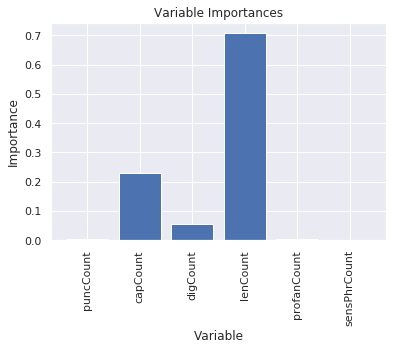

In [70]:
#Random Forest
from sklearn.ensemble import RandomForestClassifier
from numpy.core.umath_tests import inner1d
rfc=RandomForestClassifier(n_estimators=100)
rfc.fit(x_train,y_train)
rfc_pred=rfc.predict(x_test)
print(classification_report(y_test,rfc_pred))
cnfmtx=confusion_matrix(y_test,rfc_pred)
print("Confusion matrix:\n",cnfmtx)

print("Mean squared error: %.2f" %mean_squared_error(y_test, rfc_pred))
print("Mean absolute error: %.2f" %mean_absolute_error(y_test, rfc_pred))
print('Root Mean Squared Error: %.2f ' %np.sqrt(mean_squared_error(y_test, rfc_pred)))
print("Accuracy ",accuracy_score(y_test,rfc_pred))

#plot 1 tree
tree = rfc.estimators_[5]
export_graphviz(tree, out_file = 'tree.dot', feature_names = features, rounded = True, precision = 1)
(graph, ) = pydot.graph_from_dot_file('tree.dot')
Image(graph.create_png())


#get important features
# Get numerical feature importances
importances = list(rfc.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(features, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

#plot important features
x_values = list(range(len(importances)))
# Make a bar chart
plt.bar(x_values, importances, orientation = 'vertical')
# Tick labels for x axis
plt.xticks(x_values, features, rotation='vertical')
# Axis labels and title
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

### Simple Vector Machine

After analysing the outputs of decions tree and random forest, we now try SVM on to the dataset

In [71]:
#SVM
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report,confusion_matrix
model = SVC()
model.fit(x_train,y_train)
predictions = model.predict(x_test)
print(classification_report(y_test,predictions))
cnfmtx=confusion_matrix(y_test,predictions)
print("Confusion matrix:\n",cnfmtx)

print("Mean squared error: %.2f" %mean_squared_error(y_test, predictions))
print("Mean absolute error: %.2f" %mean_absolute_error(y_test, predictions))
print('Root Mean Squared Error: %.2f ' %np.sqrt(mean_squared_error(y_test, predictions)))

/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


              precision    recall  f1-score   support

           0       0.65      0.05      0.09      4497
           1       0.57      0.98      0.72      5772

    accuracy                           0.57     10269
   macro avg       0.61      0.51      0.40     10269
weighted avg       0.61      0.57      0.44     10269

Confusion matrix:
 [[ 205 4292]
 [ 108 5664]]
Mean squared error: 0.43
Mean absolute error: 0.43
Root Mean Squared Error: 0.65 


## Doc2Vec for Authenticity of the News Source
REf: https://medium.com/@mishra.thedeepak/doc2vec-simple-implementation-example-df2afbbfbad5

In [0]:
#Import all the dependencies
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from nltk.tokenize import word_tokenize

In [73]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [75]:
link = "https://drive.google.com/open?id=1Q6cJBa-l4KbYH58XewenGW-G9nzgcRAS"
fluff, id = link.split('=')
print (id) # Verify that you have everything after '='

1Q6cJBa-l4KbYH58XewenGW-G9nzgcRAS


In [0]:
downloaded = drive.CreateFile({'id':id}) 
downloaded.GetContentFile('sample_test_data.csv')  

In [77]:

df_Source = pd.read_csv("sample_test_data.csv")
df_Source

,headline,article,source,issensational
0,VIDEO: Host Breaks Down As He Learns What Musl...,"June 27, 2017Emily AnnReligion, World News\nA ...",Madworld,1
1,Chinese city leadership shake-up signals Xi po...,Beijing – A sudden leadership change in one of...,Brief.News,0
2,Miami judge rules Florida’s new ‘Stand Your Gr...,Brandon Morse 2 hours\nA Miami-Dade judge rule...,TheBlaze,1
3,"Trump, reversing course, wants Senate Republic...",Michael Reynolds / Getty Images\nPresident Tru...,LA Times – Politics,0
4,Pro-life group alleges Twitter is suppressing ...,"Kate Scanlon Jun 27, 2017 5:36 pm\nTwitter has...",TheBlaze,1
...,...,...,...,...
995,No 3rd trial for former Ohio police officer wh...,July 18 (UPI) -- A Cincinnati prosecutor annou...,United Press International – US,0
996,Putin And Trump Discussed Election Interferenc...,Home Uncategorized \n \nPresident Donald Trum...,US Politics Info,1
997,White College Employees Fired for Parody Rap A...,"July 25, 2017July 25, 2017 Christopher Kemmett...",The Real Strategy,1
998,Man Stuck Inside Of ATM Begs For Help As Peopl...,"Posted by Asia Mayfield | Jul 17, 2017 | Ameri...",Conservative Daily Post,1


In [78]:
data = df_Source['source'].values.tolist()
print(type(data))
tagged_data = [TaggedDocument(words=word_tokenize(_d.lower()), tags=[str(df_Source.loc[i,'issensational'])]) for i, _d in enumerate(data)]
#tagged_data = [TaggedDocument(words=word_tokenize(_d.lower()), tags=[str(i)]) for i, _d in enumerate(data)]
tagged_data

<class 'list'>


[TaggedDocument(words=['madworld'], tags=['1']),
 TaggedDocument(words=['brief.news'], tags=['0']),
 TaggedDocument(words=['theblaze'], tags=['1']),
 TaggedDocument(words=['la', 'times', '–', 'politics'], tags=['0']),
 TaggedDocument(words=['theblaze'], tags=['1']),
 TaggedDocument(words=['the', 'truth', 'division'], tags=['1']),
 TaggedDocument(words=['miami', 'herald', '–', 'politics'], tags=['0']),
 TaggedDocument(words=['united', 'press', 'international', '–', 'us'], tags=['0']),
 TaggedDocument(words=['usa', 'supreme'], tags=['1']),
 TaggedDocument(words=['proud', 'leader'], tags=['1']),
 TaggedDocument(words=['lady', 'liberty', 'news'], tags=['1']),
 TaggedDocument(words=['the', 'diplomat'], tags=['0']),
 TaggedDocument(words=['foreign', 'policy'], tags=['0']),
 TaggedDocument(words=['empire', 'herald'], tags=['1']),
 TaggedDocument(words=['msnbc'], tags=['0']),
 TaggedDocument(words=['the', 'conversation', '–', 'politics'], tags=['0']),
 TaggedDocument(words=['new', 'york', 'tim

## Iterations for the Model

With the new datasource, we perform about 60 iterations to perfect the model.

In [79]:
max_epochs = 100
vec_size = 20
alpha = 0.025



model = Doc2Vec(size=vec_size,
                alpha=alpha, 
                min_alpha=0.00025,
                min_count=1,
                dm =0)
  
model.build_vocab(tagged_data)

for epoch in range(max_epochs):
    print('iteration {0}'.format(epoch))
    model.train(tagged_data,total_examples=model.corpus_count,epochs=model.iter)
    # decrease the learning rate
    model.alpha -= 0.0002
    # fix the learning rate, no decay
    model.min_alpha = model.alpha

    
model.save("d2v.model")
print("Model Saved")

/usr/local/lib/python3.6/dist-packages/gensim/models/doc2vec.py:570: UserWarning: The parameter `size` is deprecated, will be removed in 4.0.0, use `vector_size` instead.
  warnings.warn("The parameter `size` is deprecated, will be removed in 4.0.0, use `vector_size` instead.")
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:17: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).


iteration 0
iteration 1
iteration 2
iteration 3
iteration 4
iteration 5
iteration 6
iteration 7
iteration 8
iteration 9
iteration 10
iteration 11
iteration 12
iteration 13
iteration 14
iteration 15
iteration 16
iteration 17
iteration 18
iteration 19
iteration 20
iteration 21
iteration 22
iteration 23
iteration 24
iteration 25
iteration 26
iteration 27
iteration 28
iteration 29
iteration 30
iteration 31
iteration 32
iteration 33
iteration 34
iteration 35
iteration 36
iteration 37
iteration 38
iteration 39
iteration 40
iteration 41
iteration 42
iteration 43
iteration 44
iteration 45
iteration 46
iteration 47
iteration 48
iteration 49
iteration 50
iteration 51
iteration 52
iteration 53
iteration 54
iteration 55
iteration 56
iteration 57
iteration 58
iteration 59
iteration 60
iteration 61
iteration 62
iteration 63
iteration 64
iteration 65
iteration 66
iteration 67
iteration 68
iteration 69
iteration 70
iteration 71
iteration 72
iteration 73
iteration 74
iteration 75
iteration 76
iteration

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


# Validation

Once the iterations are complete, we now test the model by feeding a new statement into the model testing its accuracy

In [80]:
#testing for a document
from gensim.models.doc2vec import Doc2Vec

model= Doc2Vec.load("d2v.model")
#to find the vector of a document which is not in training data
#test_data = word_tokenize('A aqi men served her what she thought was meat and rice, but it was something else entirely — something far worse.ISIS held a Yazidi Christian mother captive in a cell for three days with no food or water before she was tricked into eating something absolutely cringe-worthy by an evil guard. When she finished her meal, the guard said, “We cooked your one-year-old son that we took from you, and this is what you just ate.”The faces behind this gruesome act of terror are devil-worshiping men who believe they are worshiping god and carry out unspeakably cruel acts against minorities in the Middle East daily. These men are taking women and children as sex slaves and massacring thousands every day. Anyone who can do something so unimaginable and follow a religion that allows it is one sick individual.The interviewer wiped away his tears, like anyone being told this horrific story would do, as his guest, identified only as Dakhill, continued with heart-wrenching stories of the captured woman in the Middle East.'.lower())
test_data = word_tokenize('The new york times magazine')
v1 = model.infer_vector(test_data)
#print("V1_infer", v1)

# to find most similar doc using tags
#similar_doc = model.docvecs.most_similar('1')
similar_doc = model.docvecs.most_similar([v1])
print(similar_doc[0][0])

1


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


### Inference

When the source is mentioned as "The new york times magazine", the model detects it as a truthful data source.

After this validation, we now go on to add this as a data enrichment into the dataset by adding a new coukumn to it

In [81]:
sensationCol=[]
for row in dfs_train_sensa['context']:
    try:
        
        test_data = word_tokenize(row.lower())
        v1 = model.infer_vector(test_data)
        similar_doc = model.docvecs.most_similar([v1])
        sensationCol.append(similar_doc[0][0])
    except:
        pass
sourceCol=list(map(int, sensationCol))
sourceCol

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[0,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 1,


The new column is now called "context_new"

In [82]:
dfs_train_sensa['context_new']=pd.Series(sensationCol)
dfs_train_sensa

,ID,label,statement,subject(s),speaker,speaker's job title,state info,party affiliation,barely true counts,false counts,half true counts,mostly true counts,pants on fire counts,context,verdict,puncCount,capCount,digCount,lenCount,profanCount,sensPhrCount,context_new
0,2635.json,False,Says the Annies List political group supports ...,abortion,dwayne-bohac,State representative,Texas,republican,0.0,1.0,0.0,0.0,0.0,a mailer,0,0.0,0.0,0.0,8.0,0.0,NaN,0
1,10540.json,half-true,When did the decline of coal start? It started...,"energy,history,job-accomplishments",scott-surovell,State delegate,Virginia,democrat,0.0,0.0,1.0,1.0,0.0,a floor speech.,1,0.0,0.0,0.0,15.0,0.0,NaN,0
2,324.json,mostly-true,"Hillary Clinton agrees with John McCain ""by vo...",foreign-policy,barack-obama,President,Illinois,democrat,70.0,71.0,160.0,163.0,9.0,Denver,1,0.0,1.0,0.0,6.0,0.0,NaN,0
3,1123.json,False,Health care reform legislation is likely to ma...,health-care,blog-posting,NaN,NaN,none,7.0,19.0,3.0,5.0,44.0,a news release,0,0.0,0.0,0.0,14.0,0.0,NaN,0
4,9028.json,half-true,The economic turnaround started at the end of ...,"economy,jobs",charlie-crist,NaN,Florida,democrat,15.0,9.0,20.0,19.0,2.0,an interview on CNN,1,0.0,3.0,0.0,19.0,0.0,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10264,5473.json,mostly-true,There are a larger number of shark attacks in ...,"animals,elections",aclu-florida,NaN,Florida,none,0.0,1.0,1.0,1.0,0.0,"interview on ""The Colbert Report""",1,NaN,NaN,NaN,NaN,0.0,NaN,NaN
10265,3408.json,mostly-true,Democrats have now become the party of the [At...,elections,alan-powell,NaN,Georgia,republican,0.0,0.0,0.0,1.0,0.0,an interview,1,NaN,NaN,NaN,NaN,0.0,NaN,NaN
10266,3959.json,half-true,Says an alternative to Social Security that op...,"retirement,social-security",herman-cain,NaN,Georgia,republican,4.0,11.0,5.0,3.0,3.0,a Republican presidential debate,1,NaN,NaN,NaN,NaN,0.0,NaN,NaN
10267,2253.json,False,On lifting the U.S. Cuban embargo and allowing...,"florida,foreign-policy",jeff-greene,NaN,Florida,democrat,3.0,1.0,3.0,0.0,0.0,a televised debate on Miami's WPLG-10 against ...,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN


In [83]:
# same for testing data
testsourceCol=[]
for row in dfs_test_sensa['context']:
    try:
        
        test_data = word_tokenize(row.lower())
        v1 = model.infer_vector(test_data)
        similar_doc = model.docvecs.most_similar([v1])
        testsourceCol.append(similar_doc[0][0])
    except:
        pass
testsourceCol=list(map(int, testsourceCol))
dfs_test_sensa['context_new']=pd.Series(testsourceCol)
dfs_test_sensa

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


,ID,label,statement,subject(s),speaker,speaker's job title,state info,party affiliation,barely true counts,false counts,half true counts,mostly true counts,pants on fire counts,context,verdict,puncCount,capCount,digCount,lenCount,profanCount,sensPhrCount,context_new
0,2635.json,False,Says the Annies List political group supports ...,abortion,dwayne-bohac,State representative,Texas,republican,0.0,1.0,0.0,0.0,0.0,a mailer,0,0.0,0.0,0.0,8.0,0.0,0.0,0.0
1,10540.json,half-true,When did the decline of coal start? It started...,"energy,history,job-accomplishments",scott-surovell,State delegate,Virginia,democrat,0.0,0.0,1.0,1.0,0.0,a floor speech.,1,0.0,0.0,0.0,15.0,0.0,0.0,1.0
2,324.json,mostly-true,"Hillary Clinton agrees with John McCain ""by vo...",foreign-policy,barack-obama,President,Illinois,democrat,70.0,71.0,160.0,163.0,9.0,Denver,1,0.0,1.0,0.0,6.0,0.0,0.0,0.0
3,1123.json,False,Health care reform legislation is likely to ma...,health-care,blog-posting,NaN,NaN,none,7.0,19.0,3.0,5.0,44.0,a news release,0,0.0,0.0,0.0,14.0,0.0,0.0,1.0
4,9028.json,half-true,The economic turnaround started at the end of ...,"economy,jobs",charlie-crist,NaN,Florida,democrat,15.0,9.0,20.0,19.0,2.0,an interview on CNN,1,0.0,3.0,0.0,19.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10264,5473.json,mostly-true,There are a larger number of shark attacks in ...,"animals,elections",aclu-florida,NaN,Florida,none,0.0,1.0,1.0,1.0,0.0,"interview on ""The Colbert Report""",1,NaN,NaN,NaN,NaN,0.0,NaN,NaN
10265,3408.json,mostly-true,Democrats have now become the party of the [At...,elections,alan-powell,NaN,Georgia,republican,0.0,0.0,0.0,1.0,0.0,an interview,1,NaN,NaN,NaN,NaN,0.0,NaN,NaN
10266,3959.json,half-true,Says an alternative to Social Security that op...,"retirement,social-security",herman-cain,NaN,Georgia,republican,4.0,11.0,5.0,3.0,3.0,a Republican presidential debate,1,NaN,NaN,NaN,NaN,0.0,NaN,NaN
10267,2253.json,False,On lifting the U.S. Cuban embargo and allowing...,"florida,foreign-policy",jeff-greene,NaN,Florida,democrat,3.0,1.0,3.0,0.0,0.0,a televised debate on Miami's WPLG-10 against ...,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN


In [0]:
x_train1=dfs_train_sensa[dfs_train_sensa.columns[15:22]]
x_train1 = x_train1.astype(float)
x_train=np.nan_to_num(x_train1)


y_train=dfs_train_sensa['verdict']

x_test1 = dfs_test_sensa[dfs_test_sensa.columns[15:22]]
x_test = np.nan_to_num(x_test1)
y_test = dfs_test_sensa['verdict']

In [85]:
x_train

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

## Test dataset validation



In [86]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
gnb = GaussianNB()
gnb.fit(x_train,y_train)
y_pred = gnb.predict(x_test)
print(classification_report(y_test,y_pred))
cnfmtx=confusion_matrix(y_test,y_pred)
print("Confusion matrix:\n",cnfmtx)

print("Mean squared error: %.2f" %mean_squared_error(y_test, y_pred))
print("Mean absolute error: %.2f" %mean_absolute_error(y_test, y_pred))
print('Root Mean Squared Error: %.2f ' %np.sqrt(mean_squared_error(y_test, y_pred)))
print('Accuracy :', accuracy_score(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.44      0.99      0.61      4497
           1       0.60      0.02      0.03      5772

    accuracy                           0.44     10269
   macro avg       0.52      0.50      0.32     10269
weighted avg       0.53      0.44      0.28     10269

Confusion matrix:
 [[4438   59]
 [5683   89]]
Mean squared error: 0.56
Mean absolute error: 0.56
Root Mean Squared Error: 0.75 
Accuracy : 0.44084136722173534
